In [2]:
import torch

print(torch.cuda.is_available())


print(torch.cuda.current_device())

print(torch.cuda.device(0))

print(torch.cuda.device_count())

print(torch.cuda.get_device_name(0))

True
0
1
GeForce RTX 3070


In [2]:
import numpy as np 
import time

import torch 
import torch.nn as nn
import torch.nn.functional as F 
from torch.utils.data import TensorDataset, DataLoader

import matplotlib.pyplot as plt
from collections import OrderedDict

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import StandardScaler
import os
import pandas as pd

# from keras.utils import np_utils
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
import json

from google.cloud import bigquery
from google.oauth2 import service_account
import datetime
import pickle

from tqdm.notebook import tqdm

import warnings
warnings.filterwarnings("ignore")
from SA_FunctionsRaycon import *
import random

random.seed(1234)
np.random.seed(1234)
torch.manual_seed(1234)

In [3]:
from Source.inception import Inception, InceptionBlock

In [4]:
class Flatten(nn.Module):
    def __init__(self, out_features):
        super(Flatten, self).__init__()
        self.output_dim = out_features

    def forward(self, x):
        return x.view(-1, self.output_dim)
    
class Reshape(nn.Module):
    def __init__(self, out_shape):
        super(Reshape, self).__init__()
        self.out_shape = out_shape

    def forward(self, x):
        return x.view(-1, *self.out_shape)

In [8]:
def label_data(training_data,labels):
    training_data['label']='no_event'
    for appliance,label,time in zip(labels.equipment_type,labels.event_type,labels.event_time):
        if label=='ON':
            start_time = time - datetime.timedelta(milliseconds=100)
            end_time = time + datetime.timedelta(milliseconds=1000)
        else:
            start_time = time - datetime.timedelta(milliseconds=750)
            end_time = time + datetime.timedelta(milliseconds=100)
#         else:
#             start_time = time - datetime.timedelta(milliseconds=200)
#             end_time = time + datetime.timedelta(milliseconds=200)

        training_data.loc[(training_data.logged_on_utc>=start_time) & 
                          (training_data.logged_on_utc<=end_time),'label']= appliance+'_'+label

    return training_data

def import_labels(property_id):
    labels=pd.read_excel('Data/Labelled_Data_22_08_2021.xlsx')
    labels=labels[labels['lead_property_id']==property_id]
    labels['event_time']=[datetime.datetime.fromtimestamp(timestamp/1000)-datetime.timedelta(hours=5.5) 
                          for timestamp in labels['event_time']]
    return labels

def label_training_data(device_id, property_id, raw_training_data):
    labels=import_labels(property_id)
    training_data = raw_training_data[raw_training_data.device_id==device_id]
    training_data=label_data(training_data,labels)
    return training_data


In [9]:
# all_training_data = pd.read_pickle('Data/logger_data_11_08_2021.pkl')
# labelled_data = label_training_data('devid_C82B9690A288', 1403, all_training_data)
# labelled_data.to_pickle('Data/labelled_data_11_08_2021.pkl')

In [10]:
labels = import_labels(1403)
labels = labels.sort_values(by='event_time')

In [13]:
labels[170:220]

,id,created_on,updated_on,is_disabled,uuid,device_id,activity_type,equipment_type,event_time,event_type,lead_property_id,date
170,171,2021-08-10 05:51:59.138,2021-08-10 05:51:59.138,0,a6c2d34caba64fa0b4cd55e54285297b,53457bfe-4695-4a7c-83c5-76ce8b305082,NaN,Refrigerator,2021-08-09 16:16:01.200,OFF,1403,2021-08-09 16:16:01.200
171,172,2021-08-10 05:51:59.138,2021-08-10 05:51:59.138,0,460423a966f94528b5185a3149ff18d6,53457bfe-4695-4a7c-83c5-76ce8b305082,NaN,Refrigerator,2021-08-09 17:39:42.400,ON,1403,2021-08-09 17:39:42.400
172,173,2021-08-10 05:51:59.138,2021-08-10 05:51:59.138,0,ed2e9aa408204b88bc0157c77cc534e6,53457bfe-4695-4a7c-83c5-76ce8b305082,NaN,Refrigerator,2021-08-09 18:05:50.000,OFF,1403,2021-08-09 18:05:50.000
173,174,2021-08-21 11:28:23.559,2021-08-21 11:28:23.559,0,28d92ff22dff4ac0a50a5228130b0243,03cb5eec-25e2-4ea8-87e0-e9afcb0d75af,NaN,AC,2021-08-16 06:35:12.600,ON,1403,2021-08-16 06:35:12.600
175,176,2021-08-21 11:39:51.707,2021-08-21 11:39:51.707,0,0d295d0f155345ac8d7003b6456c9873,b882c920-44ff-4943-b726-e0ba676fd7c2,NaN,Microwave,2021-08-16 06:43:58.800,ON,1403,2021-08-16 06:43:58.800
176,177,2021-08-21 11:39:51.707,2021-08-21 11:39:51.707,0,30d50b5402ad43cea9774d806f722c57,6c46ce84-2597-47a1-bb83-29f8b080e5db,NaN,Geyser,2021-08-16 06:45:46.800,ON,1403,2021-08-16 06:45:46.800
177,178,2021-08-21 11:39:51.707,2021-08-21 11:39:51.707,0,ea6e09327caa42deb62df190a3412355,b882c920-44ff-4943-b726-e0ba676fd7c2,NaN,Microwave,2021-08-16 06:46:58.400,OFF,1403,2021-08-16 06:46:58.400
174,175,2021-08-21 11:28:23.559,2021-08-21 11:28:23.559,0,b35b84377e8e42d4a038c5e0e0d203ef,03cb5eec-25e2-4ea8-87e0-e9afcb0d75af,NaN,AC,2021-08-16 06:55:48.800,OFF,1403,2021-08-16 06:55:48.800
179,180,2021-08-21 11:54:51.897,2021-08-21 11:54:51.897,0,50fa9211c0224dd08797e535d37de8ae,b882c920-44ff-4943-b726-e0ba676fd7c2,NaN,Microwave,2021-08-16 07:00:44.800,ON,1403,2021-08-16 07:00:44.800
180,181,2021-08-21 11:54:51.897,2021-08-21 11:54:51.897,0,a0867e8d33564f988728cb834745daca,b882c920-44ff-4943-b726-e0ba676fd7c2,NaN,Microwave,2021-08-16 07:03:44.400,OFF,1403,2021-08-16 07:03:44.400


In [7]:
labelled_data = pd.read_pickle('Data/labelled_data_060821_090821')

In [8]:
event_instances = labelled_data[labelled_data.label!='no_event']

In [9]:
event_instances.columns

Index(['created_on_utc', 'dump', 'logged_on_local', 'property_id',
       'voltage_V1', 'voltage_V2', 'voltage_V3', 'current_i1', 'current_i2',
       'current_i3', 'active_power_P1', 'active_power_P2', 'active_power_P3',
       'apparent_power_S1', 'apparent_power_S2', 'apparent_power_S3',
       'reactive_power_Q1', 'reactive_power_Q2', 'reactive_power_Q3',
       'frequency_Fq1', 'frequency_Fq2', 'frequency_Fq3', 'active_energy_Pt1',
       'active_energy_Pt2', 'active_energy_Pt3', 'apparent_energy_St1',
       'apparent_energy_St2', 'apparent_energy_St3', 'reactive_energy_Qt1',
       'reactive_energy_Qt2', 'reactive_energy_Qt3', 'device_id',
       'power_factor_PF1', 'power_factor_PF2', 'power_factor_PF3', 'label',
       'mains_power'],
      dtype='object')

In [10]:
labelled_data['mains_power'] = labelled_data['active_power_P1']+labelled_data['active_power_P2']+labelled_data['active_power_P3']
labelled_data['reactive_power'] = labelled_data['reactive_power_Q1']+labelled_data['reactive_power_Q2']+labelled_data['reactive_power_Q3']
# labelled_data=labelled_data.sort_values('logged_on_utc')

encoder = LabelEncoder()
encoder.fit(labelled_data['label'])

LabelEncoder()

In [11]:
print(encoder.classes_)
print(encoder.transform(encoder.classes_))


['Geyser_OFF' 'Geyser_ON' 'Refrigerator_OFF' 'Refrigerator_ON' 'no_event']
[0 1 2 3 4]


In [12]:
def get_dict(x):
    x['prev_mean'] = x['mains_power'].rolling(5).mean()
    x['time_since_last_event'] = 0
    x['time_since_event_start'] = 0
    x['normalized_mains_power'] = 0

    print(datetime.datetime.now())
    x = x.reset_index()

    x_dict = x.to_dict('records')
    print(datetime.datetime.now())
    print('x_dict made')
    
    return x_dict

def get_features(x_dict):
    prev_mean = 0
    prev_activity_time = pd.to_datetime('2021-08-03')
    current_activity_time = pd.to_datetime('2021-08-03')
    activity_ongoing = False

    for row in tqdm(x_dict):

        label = row['label']

        if (label != 'no_event') and (activity_ongoing == False):
            current_activity_time = row['logged_on_utc']
            prev_mean = row['prev_mean']
            activity_ongoing = True

        elif (label == 'no_event') and (activity_ongoing == True):
            prev_activity_time = row['logged_on_utc']
            activity_ongoing = False
            activity_ongoing = False

        elif (label != 'no_event') and (activity_ongoing == True):
            row['time_since_last_event'] = (row['logged_on_utc'] - prev_activity_time).microseconds / 1000000 + \
                                           (row['logged_on_utc'] - prev_activity_time).seconds
            row['time_since_event_start'] = (row['logged_on_utc'] - current_activity_time).microseconds / 1000000 + \
                                            (row['logged_on_utc'] - current_activity_time).seconds
            row['normalized_mains_power'] = row['mains_power'] - prev_mean

        elif (label == 'no_event') and (activity_ongoing == False):
            row['time_since_last_event'] = (row['logged_on_utc'] - prev_activity_time).microseconds / 1000000 + \
                                           (row['logged_on_utc'] - prev_activity_time).seconds
            row['time_since_event_start'] = 0
            row['normalized_mains_power'] = row['mains_power'] - prev_mean
    return x_dict

In [13]:
x_dict = get_dict(labelled_data)

2021-08-18 11:29:23.201487
2021-08-18 11:31:32.734490
x_dict made


In [14]:
x_out = get_features(x_dict)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5002520/5002520 [00:56<00:00, 89236.65it/s]


In [15]:
# tr_data = 

In [16]:
tr_data = pd.DataFrame.from_records(x_out)
tr_data = tr_data.fillna(0)

In [17]:
tr_data.head(50)

,logged_on_utc,created_on_utc,dump,logged_on_local,property_id,voltage_V1,voltage_V2,voltage_V3,current_i1,current_i2,...,power_factor_PF1,power_factor_PF2,power_factor_PF3,label,mains_power,reactive_power,prev_mean,time_since_last_event,time_since_event_start,normalized_mains_power
0,2021-08-06 00:00:00.000,2021-08-05 23:55:47.138104,0,2021-08-06 05:30:00.000,1403.0,223.68,244.03,243.47,0.15,0.46,...,-0.129394,0.980164,-0.705561,no_event,219.88,161.27,0.000,0.00,0.0,219.88
1,2021-08-06 00:00:00.050,2021-08-05 23:55:47.138242,0,2021-08-06 05:30:00.050,1403.0,223.69,244.08,243.45,0.15,0.46,...,-0.129394,0.980164,-0.705561,no_event,220.36,161.27,0.000,0.05,0.0,220.36
2,2021-08-06 00:00:00.100,2021-08-05 23:55:47.138298,0,2021-08-06 05:30:00.100,1403.0,223.70,244.10,243.45,0.15,0.46,...,-0.129394,0.980164,-0.705561,no_event,220.03,161.27,0.000,0.10,0.0,220.03
3,2021-08-06 00:00:00.150,2021-08-05 23:55:47.138367,0,2021-08-06 05:30:00.150,1403.0,223.71,244.14,243.43,0.15,0.46,...,-0.129394,0.980164,-0.705561,no_event,220.30,161.27,0.000,0.15,0.0,220.30
4,2021-08-06 00:00:00.200,2021-08-05 23:55:47.138428,0,2021-08-06 05:30:00.200,1403.0,223.73,244.17,243.41,0.15,0.46,...,-0.129394,0.980164,-0.705561,no_event,220.01,161.27,220.116,0.20,0.0,220.01
5,2021-08-06 00:00:00.250,2021-08-05 23:55:47.138471,0,2021-08-06 05:30:00.250,1403.0,223.74,244.19,243.38,0.15,0.46,...,-0.129394,0.980164,-0.705561,no_event,219.93,161.27,220.126,0.25,0.0,219.93
6,2021-08-06 00:00:00.300,2021-08-05 23:55:47.138514,0,2021-08-06 05:30:00.300,1403.0,223.74,244.20,243.37,0.15,0.46,...,-0.129394,0.980164,-0.705561,no_event,219.68,161.27,219.990,0.30,0.0,219.68
7,2021-08-06 00:00:00.350,2021-08-05 23:55:47.138554,0,2021-08-06 05:30:00.350,1403.0,223.75,244.21,243.35,0.15,0.46,...,-0.129394,0.980164,-0.705561,no_event,219.81,161.27,219.946,0.35,0.0,219.81
8,2021-08-06 00:00:00.400,2021-08-05 23:55:47.138595,0,2021-08-06 05:30:00.400,1403.0,223.75,244.22,243.34,0.15,0.46,...,-0.129394,0.980164,-0.705561,no_event,219.72,161.27,219.830,0.40,0.0,219.72
9,2021-08-06 00:00:00.450,2021-08-05 23:55:47.138636,0,2021-08-06 05:30:00.450,1403.0,223.76,244.22,243.34,0.15,0.46,...,-0.129394,0.980164,-0.705561,no_event,219.69,161.27,219.766,0.45,0.0,219.69


In [33]:
x_values=tr_data[['current_i1', 'current_i2',
       'current_i3','active_power_P1', 'active_power_P2', 'active_power_P3','reactive_power_Q1', 'reactive_power_Q2', 'reactive_power_Q3']].fillna(0)
LOOK_BACK=15
def create_dataset (X, look_back = 7):
    Xs, ys = [], []
 
    for i in tqdm(range(len(X)-look_back)):
#         v = X['mains_power'][i:i+look_back].values
        v = X[i:i+look_back].values
        Xs.append(v)
        ys.append(dummy_y[i+look_back])
 
    return np.array(Xs).reshape(len(Xs), look_back, len(X.columns)), np.array(ys)

# encode and transform labels 
encoder = LabelEncoder()
encoder.fit(tr_data['label'])
encoded_Y = encoder.transform(tr_data['label'])

# convert integers to dummy variables (i.e. one hot encoded)
dummy_y = np.zeros((encoded_Y.size, encoded_Y.max()+1))
dummy_y[np.arange(encoded_Y.size),encoded_Y] = 1

X_train, y_train = create_dataset(x_values,LOOK_BACK)
# X_train_back, y_train_back = X_train, y_train
# X_train, y_train = create_dataset(training_data.loc[training_data.reset_index().index.isin(pd.Index(lis))])

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5002505/5002505 [01:47<00:00, 46672.79it/s]


In [34]:
print(len(x_values))
print(len(tr_data))
X_train.shape

5002520
5002520


(5002505, 15, 6)

In [35]:
pd.DataFrame(y_train).sum()
# data.reset_index()[data.reset_index()['label']!=''].pivot_table(index='label', aggfunc='count')

0        360.0
1        460.0
2        604.0
3        805.0
4    5000276.0
dtype: float64

In [36]:
np.save('Data/X_train2_0609.npy', X_train)
np.save('Data/y_train2_0609.npy', y_train)

In [7]:
LOOK_BACK=15
InceptionTime = nn.Sequential(
                    Reshape(out_shape=(6,LOOK_BACK)),
                    InceptionBlock(
                        in_channels=6, 
                        n_filters=32, 
                        kernel_sizes=[5,13,23],
                        bottleneck_channels=32,
                        use_residual=True,
                        activation=nn.ReLU()
                    ),
                    InceptionBlock(
                        in_channels=32*4, 
                        n_filters=32, 
                        kernel_sizes=[5,13,23],
                        bottleneck_channels=32,
                        use_residual=True,
                        activation=nn.ReLU()
                    ),
                    nn.AdaptiveMaxPool1d(output_size=1),
#     nn.AdaptiveMaxPool1d(output_size=1),
                    Flatten(out_features=32*4*1),
                    nn.Linear(in_features=4*32*1, out_features=5)
        )

In [8]:
X_train = np.load('Data/X_train2_0609.npy')
y_train = np.load('Data/y_train2_0609.npy')

In [9]:
lab_0_ind = np.argwhere(y_train[:, 0] == 1).squeeze()
lab_1_ind = np.argwhere(y_train[:, 1] == 1).squeeze()
lab_2_ind = np.argwhere(y_train[:, 2] == 1).squeeze()
lab_3_ind = np.argwhere(y_train[:, 3] == 1).squeeze()
lab_4_ind = np.argwhere(y_train[:, 4] == 1).squeeze()

In [10]:
clab_4_ind = np.random.choice(lab_4_ind, 10*(len(lab_0_ind)+len(lab_1_ind)+len(lab_2_ind)+len(lab_3_ind)))
ind_list = np.hstack([lab_0_ind, lab_1_ind, lab_2_ind, lab_3_ind, clab_4_ind])

In [11]:
ind_list.shape

(24519,)

In [12]:
# Source: https://stackoverflow.com/questions/50125844/how-to-standard-scale-a-3d-matrix/50134698
import numpy as np
from sklearn.base import TransformerMixin
from sklearn.preprocessing import StandardScaler


class NDStandardScaler(TransformerMixin):
    def __init__(self, **kwargs):
        self._scaler = StandardScaler(copy=True, **kwargs)
        self._orig_shape = None

    def fit(self, X, **kwargs):
        X = np.array(X)
        # Save the original shape to reshape the flattened X later
        # back to its original shape
        if len(X.shape) > 1:
            self._orig_shape = X.shape[1:]
        X = self._flatten(X)
        self._scaler.fit(X, **kwargs)
        return self

    def transform(self, X, **kwargs):
        X = np.array(X)
        X = self._flatten(X)
        X = self._scaler.transform(X, **kwargs)
        X = self._reshape(X)
        return X

    def _flatten(self, X):
        # Reshape X to <= 2 dimensions
        if len(X.shape) > 2:
            n_dims = np.prod(self._orig_shape)
            X = X.reshape(-1, n_dims)
        return X

    def _reshape(self, X):
        # Reshape X back to it's original shape
        if len(X.shape) >= 2:
            X = X.reshape(-1, *self._orig_shape)
        return X

In [13]:
xall_data = X_train[ind_list] 
yall_data = y_train[ind_list]

nx_train, nx_test, ny_train, ny_test = train_test_split(xall_data, yall_data, test_size=0.33, random_state=42)

scaler = NDStandardScaler()
scaler.fit(nx_train)

nx_train = scaler.transform(nx_train)
nx_test = scaler.transform(nx_test)


In [14]:
tensor_x = torch.Tensor(nx_train) # transform to torch tensor
tensor_y = torch.Tensor(ny_train)


# X_test = scaler.transform(tensor_y)

dataset = TensorDataset(tensor_x,tensor_y) # create your datset
trainloader = DataLoader(dataset,batch_size=512*20, shuffle=True) # create your dataloader


In [15]:
net=InceptionTime
import torch.optim as optim
import math
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# for epoch in range(epochs):
#     for inputs, labels in trainloader:
#         inputs, labels = inputs.to(device), labels.to(device)
device = "cuda"
net.to(device)
print(device)
# start_lr = 1e-7
# end_lr = .1
epochs=100

optimizer = optim.Adam(net.parameters(), lr=0.03)
# lr_lambda = lambda x: math.exp(x * math.log(end_lr / start_lr) / (epochs * len(trainloader.dataset)))
# scheduler = torch.optim.lr_scheduler.LambdaLR(optimizer, lr_lambda)

criterion = nn.BCEWithLogitsLoss()
weight = torch.tensor([10.0, 10.0, 10.0, 10.0, 1.0])
# itera=0
# lr_find_lr=[]
# lr_find_loss=[]
# smoothing=-1e-7
for epoch in range(epochs):  # loop over the dataset multiple times
#     print(epoch)
    running_loss = 0.0
    for i, data in enumerate(trainloader, 0):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data
        inputs, labels = inputs.to(device), labels.to(device)
        weight = weight.to(device)

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = net(inputs)
        loss = criterion(outputs, labels)
        loss = loss * weight
        loss = loss.mean()
        loss.backward()
        optimizer.step()

        # print statistics
        running_loss += loss.item()
#         if i % 2000 == 1999:    # print every 2000 mini-batches
        print('[%d, %5d] loss: %.3f' % (epoch + 1, i + 1, running_loss))
        running_loss = 0.0
        
#         # Update LR
#         scheduler.step()
#         lr_step = optimizer.state_dict()["param_groups"][0]["lr"]
#         lr_find_lr.append(lr_step)
        
#             # smooth the loss
#         if itera==0:
#             lr_find_loss.append(loss)
#         else:
#             loss = smoothing  * loss + (1 - smoothing) * lr_find_loss[-1]
#             lr_find_loss.append(loss)

#         itera += 1

cuda
[1,     1] loss: 5.449
[1,     2] loss: 2.703
[2,     1] loss: 2.260
[2,     2] loss: 2.361
[3,     1] loss: 1.883
[3,     2] loss: 1.669
[4,     1] loss: 1.359
[4,     2] loss: 1.326
[5,     1] loss: 1.109
[5,     2] loss: 1.003
[6,     1] loss: 1.041
[6,     2] loss: 1.023
[7,     1] loss: 1.004
[7,     2] loss: 1.001
[8,     1] loss: 0.903
[8,     2] loss: 0.871
[9,     1] loss: 0.847
[9,     2] loss: 0.783
[10,     1] loss: 0.793
[10,     2] loss: 0.756
[11,     1] loss: 0.745
[11,     2] loss: 0.708
[12,     1] loss: 0.703
[12,     2] loss: 0.712
[13,     1] loss: 0.681
[13,     2] loss: 0.666
[14,     1] loss: 0.660
[14,     2] loss: 0.647
[15,     1] loss: 0.635
[15,     2] loss: 0.644
[16,     1] loss: 0.619
[16,     2] loss: 0.620
[17,     1] loss: 0.608
[17,     2] loss: 0.585
[18,     1] loss: 0.601
[18,     2] loss: 0.563
[19,     1] loss: 0.580
[19,     2] loss: 0.561
[20,     1] loss: 0.546
[20,     2] loss: 0.619
[21,     1] loss: 0.550
[21,     2] loss: 0.563
[22, 

In [17]:
tensor_x = torch.Tensor(nx_test) # transform to torch tensor
tensor_y = torch.Tensor(ny_test)

with torch.no_grad():
    inputs, labels = tensor_x.to(device), tensor_y.to(device)
    outputs = net(inputs)
    outputs = outputs.detach().cpu().numpy()
    
ylab = np.argmax(ny_test, axis=1)
pred = np.argmax(outputs, axis=1)
print(f1_score(y_true=ylab, y_pred=pred,average="macro"))
print(accuracy_score(y_true=ylab, y_pred=pred))
cf1 = confusion_matrix(y_true=ylab, y_pred=pred) # x_axis = predicted, y_axis = ground_truth
print(cf1)
# encoder.classes_

0.8744317063988625
0.9778793870489372
[[  91    0    0    0   23]
 [   0  125    1    1   19]
 [   0    0  110    0   87]
 [   1    7    0  240   13]
 [   6    0   16    5 7347]]


In [19]:
def calculate_metrics(cf):
    for i in range(len(cf)):
        print('For label ', i)
        true_positive = cf[i, i]
        false_positive = sum(cf[:, i]) - true_positive
        false_negative = sum(cf[i, :]) - cf[i, i]
        true_negative = sum(sum(cf)) - false_positive - false_negative - true_positive
        print('tp: ', true_positive, ' fp: ', false_positive, ' fn: ', false_negative, ' tn: ', true_negative)
    return

calculate_metrics(cf1)

For label  0
tp:  91  fp:  7  fn:  23  tn:  7971
For label  1
tp:  125  fp:  7  fn:  21  tn:  7939
For label  2
tp:  110  fp:  17  fn:  87  tn:  7878
For label  3
tp:  240  fp:  6  fn:  21  tn:  7825
For label  4
tp:  7347  fp:  142  fn:  27  tn:  576


In [19]:
test_x = tensor_x = torch.Tensor(X_train) # transform to torch tensor
test_y = torch.Tensor(y_train)

testset = TensorDataset(test_x, test_y) # create your datset
testloader = DataLoader(testset,batch_size=512*20) # create your dataloader

In [20]:
preds = []
with torch.no_grad():
    for data in testloader:
        inputs, labels = data
        inputs, labels = inputs.to(device), labels.to(device)
        # calculate outputs by running images through the network
        outputs = net(inputs)
        # the class with the highest energy is what we choose as prediction
        preds.append(np.argmax(outputs.detach().cpu().numpy(), axis=1))

In [30]:
pred = np.hstack(preds)
out = np.hstack([np.ones(15)*2, pred])
tr_data["Preds"] = out

In [ ]:
tr_data.head(50)

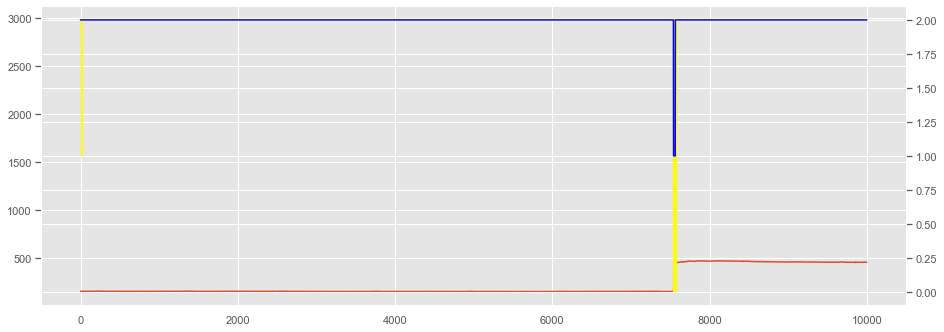

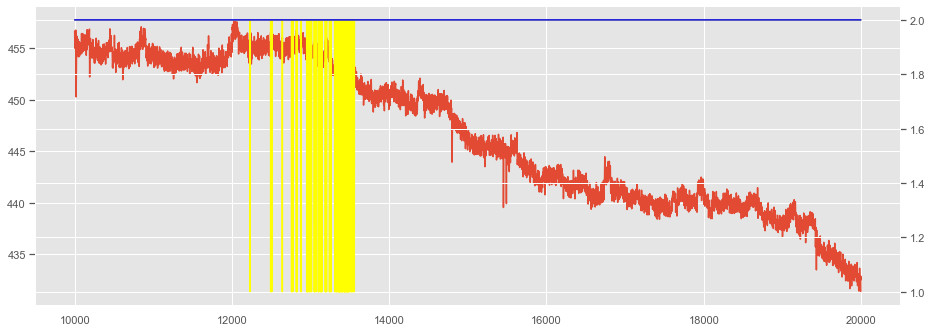

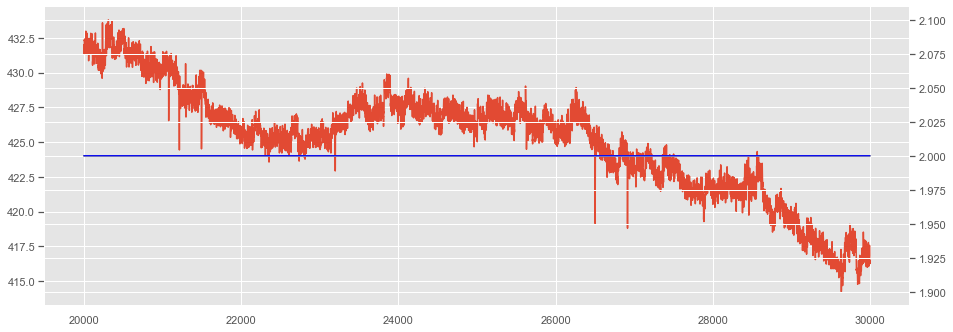

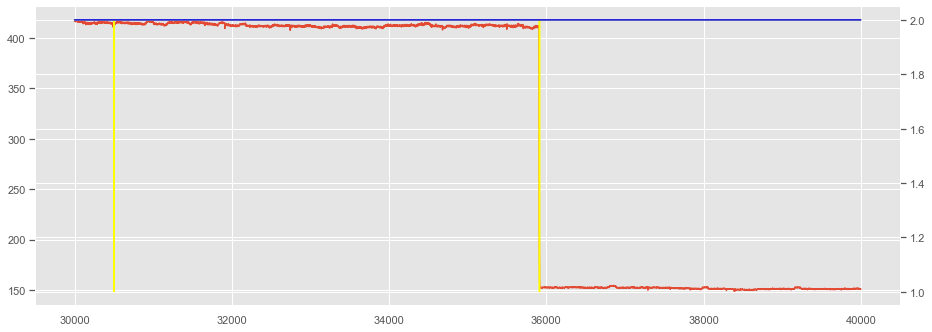

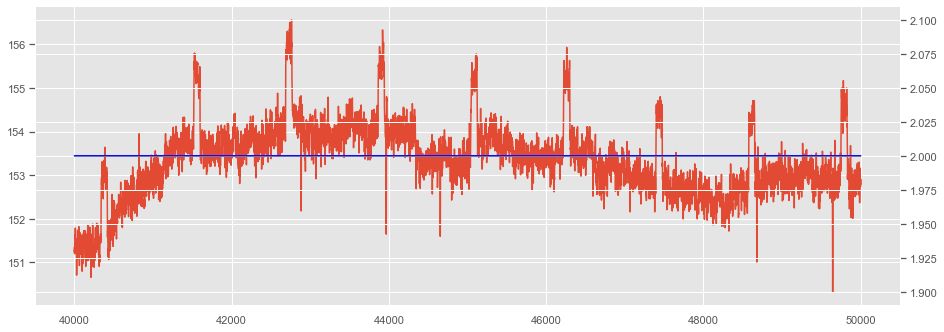

...

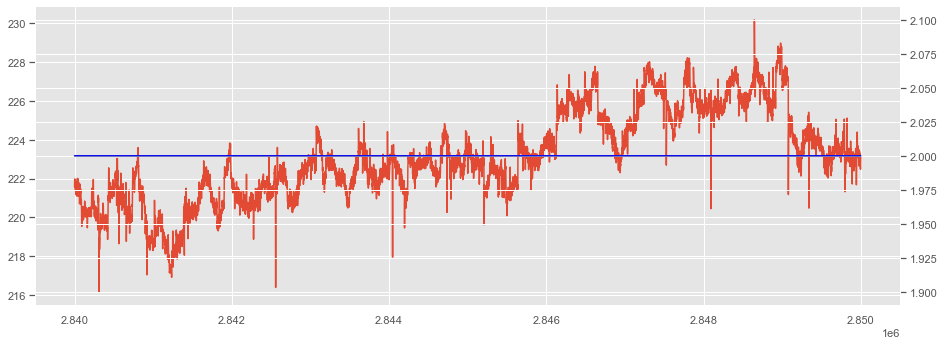

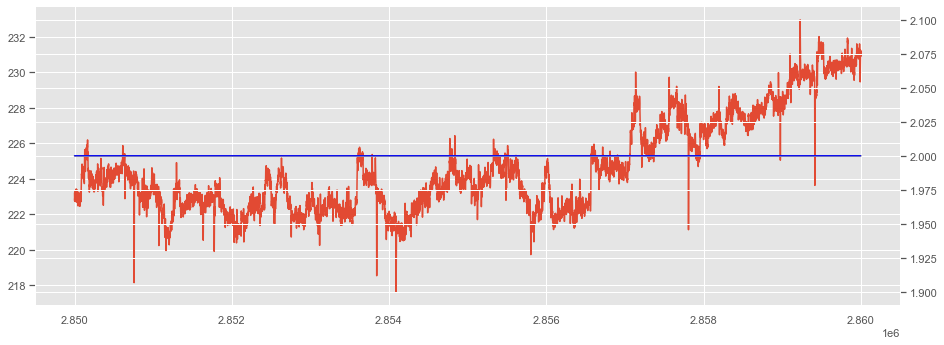

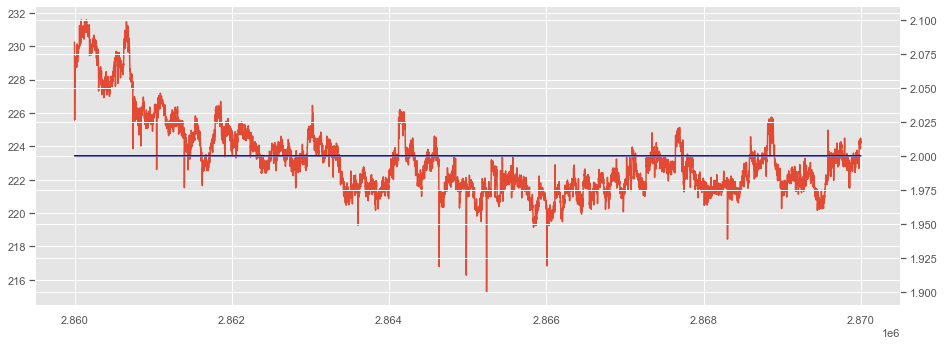

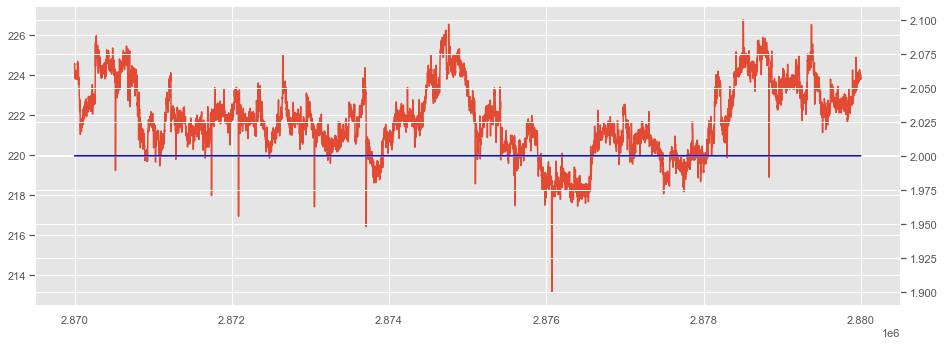

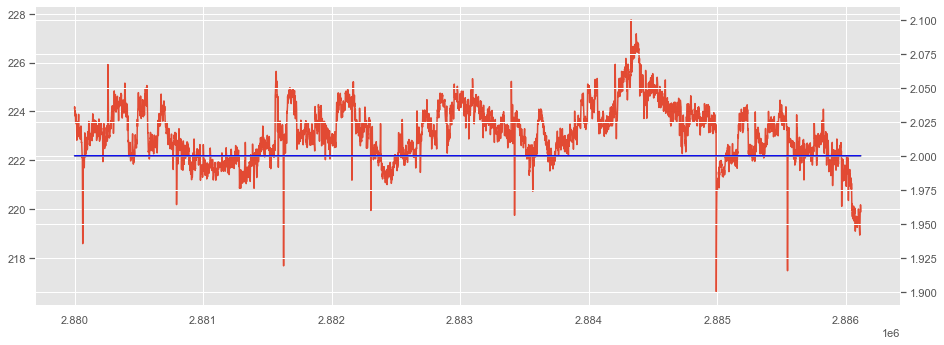

In [85]:
show_data = tr_data[['logged_on_utc', 'mains_power','prev_mean','time_since_last_event','time_since_event_start', 'normalized_mains_power', 'label', 'Preds']]
show_data.label = encoder.transform(show_data['label'])
for start in range(0, len(show_data), 10000):
    end = start + 10000
    fig,ax=plt.subplots()
    ax2=ax.twinx()
    fig.set_size_inches(15.5, 5.5)
    show_data['mains_power'][start:end].plot(ax=ax)
    show_data['Preds'][start:end].plot(ax=ax2, color='yellow')
    show_data['label'][start:end].plot(ax=ax2, color='blue')
    plt.show()

In [22]:
ylab = np.argmax(y_train, axis=1)
print(f1_score(y_true=ylab, y_pred=pred,average="macro"))
print(accuracy_score(y_true=ylab, y_pred=pred))
cf1 = confusion_matrix(y_true=ylab, y_pred=pred) # x_axis = predicted, y_axis = ground_truth
print(cf1)
calculate_metrics(cf1)

0.34773894647926884
0.9879779107059206
[[    229      73      15]
 [    189     207      18]
 [  19568   14834 2850971]]
For label  0
tp:  229  fp:  19757  fn:  88  tn:  2866030
For label  1
tp:  207  fp:  14907  fn:  207  tn:  2870783
For label  2
tp:  2850971  fp:  33  fn:  34402  tn:  698
